In [4]:
import glob
import numpy as np
import matplotlib.pyplot as plt
import tables as tb

#from invisible_cities.evm import pmaps
from invisible_cities.io import pmaps_io
from invisible_cities.database.load_db  import DataPMT, DataSiPM
from invisible_cities.reco import xy_algorithms as xya
from invisible_cities.core import system_of_units as units
from invisible_cities.cities import components as cp

# Using raw waveforms to compare with noise

In [1]:
num_files = 3
run_number = 8088
num_plots = 3
data_dir = '../../data/trigger1/'+str(run_number)+'/'
file_start = 'run_'+str(run_number)+'_000'
file_end = '_trigger1_waveforms.h5'
files = [data_dir+file_start+str(i+1)+file_end for i in range(0,num_files)]
dbfile = 'new'
s2_window = [798,808]
outer_window = [1000,1010]

In [2]:
def GetCalibratedWaveforms(run_number, file_name):
    # Load the data into events array
    i = 0
    events = []
    wfs = cp.wf_from_files([file_name], cp.WfType.rwf)
    try:
        while wfs:
            thisdata = next(wfs)
            events.append(thisdata['sipm'])
            i += 1
    except StopIteration:
        pass
    finally:
        del wfs
    events = np.array(events)
    print('Number of Events: '+str(len(events)))

    # Find suspicious SiPMs
    bad_sipms = []
    for event in range(0,len(events)):
        for sipm in range(len(events[event])):
            mean = np.mean(events[event][sipm])
            std = np.std(events[event][sipm])
            if mean > 70 or std > 70:
                bad_sipms.append(sipm)

    worst_sipms = []
    for sipm in np.unique(bad_sipms):
        count = np.count_nonzero(bad_sipms == sipm)
        #print('SiPM '+str(sipm)+' suspicious in '+str(count)+' events')
        if count == len(events):
            worst_sipms.append(sipm)

    # Calibrate data
    cal_sipms = cp.calibrate_sipms(dbfile, run_number, 0)
    calibrated_sipms = np.array([cal_sipms(wfs) for wfs in events])

    # Get rid of worst sipms
    calibrated_bad_sipms = calibrated_sipms
    calibrated_sipms = np.delete(calibrated_sipms, worst_sipms, axis=1)

    return calibrated_sipms, worst_sipms

In [6]:
calibrated_sipms, worst_sipms = GetCalibratedWaveforms(run_number, files[0])

Number of Events: 156


In [7]:
ids = np.array([i for i in range(1792)])
ids = np.delete(ids, worst_sipms)

In [8]:
# Get SiPM position information
datasipm   = DataSiPM(dbfile, run_number)
sipm_xs    = datasipm.X.values
sipm_ys    = datasipm.Y.values
sipm_xys   = np.stack((sipm_xs, sipm_ys), axis=1)
sipm_xys = np.delete(sipm_xys, worst_sipms, axis=0) # remove bad sipms

In [9]:
sipms_s2 = calibrated_sipms[:,:,s2_window[0]:s2_window[1]]
sipms_outer = calibrated_sipms[:,:,outer_window[0]:outer_window[1]]
sipms_s2_tsummed = np.sum(sipms_s2, axis=2)
sipms_outer_tsummed = np.sum(sipms_outer, axis=2)

In [21]:
np.sum(sipms_s2_tsummed[0])

2384.1139940042294

In [13]:
dcut = 15
event = 10
s2_corona = xya.corona(sipm_xys, sipms_s2_tsummed[event], datasipm,
                           Qthr            =  0 * units.pes,
                           Qlm             =  1 * units.pes,
                           lm_radius       =  0  * units.mm , # must be 0
                           new_lm_radius   =  dcut * units.mm , # must be 10mm*sqrt(2) or some number slightly larger
                           msipm           =  3,
                           consider_masked = False)[0] # get first entry, max charge
outer_corona = xya.corona(sipm_xys, sipms_outer_tsummed[event], datasipm,
                           Qthr            =  0 * units.pes,
                           Qlm             =  1 * units.pes,
                           lm_radius       =  0  * units.mm , # must be 0
                           new_lm_radius   =  dcut * units.mm , # must be 10mm*sqrt(2) or some number slightly larger
                           msipm           =  3,
                           consider_masked = True)[0] # get first entry, max charge

Even charge = 428.6681199150196 [pes]


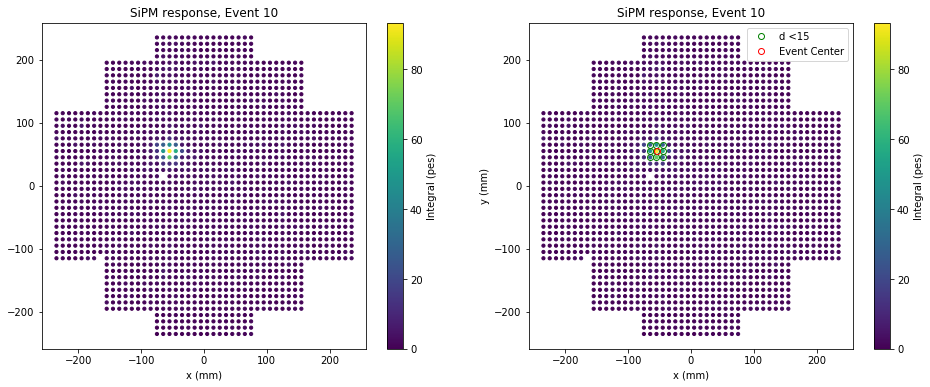

In [14]:
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.scatter(datasipm.X[ids], datasipm.Y[ids], s=10, c=sipms_s2_tsummed[event])
plt.xlabel("x (mm)")
plt.colorbar().set_label("Integral (pes)")
plt.title("SiPM response, Event "+str(event))

plt.subplot(1, 2, 2)
plt.scatter(datasipm.X[ids], datasipm.Y[ids], s=10, c=sipms_s2_tsummed[event])
sipms_d = sipm_xys[xya.get_nearby_sipm_inds(s2_corona.XY, dcut, sipm_xys)]
plt.plot(sipms_d[:,0], sipms_d[:,1], 'o', color='g', fillstyle='none', label='d <'+str(dcut))
plt.plot(s2_corona.XY[0], s2_corona.XY[1], 'o', color='red', label='Event Center',fillstyle='none')
plt.xlabel("x (mm)")
plt.ylabel("y (mm)")
plt.legend()
plt.colorbar().set_label("Integral (pes)")
plt.title("SiPM response, Event "+str(event))

event_charge = np.sum(sipms_s2_tsummed[event][xya.get_nearby_sipm_inds(s2_corona.XY, dcut, sipm_xys)])
print('Even charge = '+str(event_charge)+' [pes]')

Even charge = 6.101576870992373 [pes]


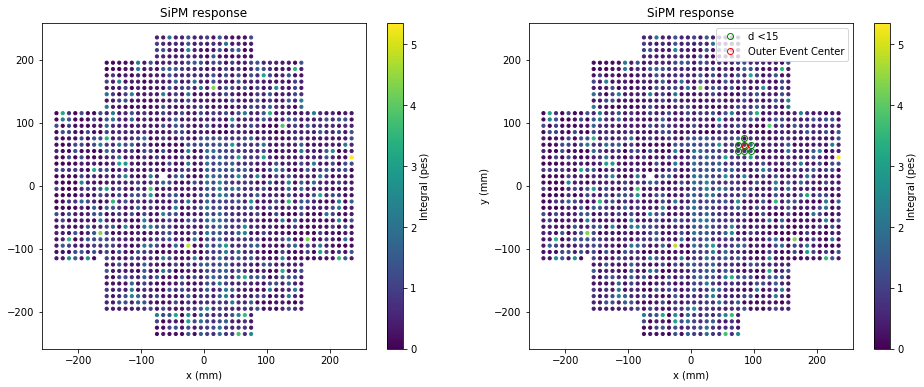

In [15]:
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.scatter(datasipm.X[ids], datasipm.Y[ids], s=10, c=sipms_outer_tsummed[0])
plt.xlabel("x (mm)")
plt.colorbar().set_label("Integral (pes)")
plt.title("SiPM response")

plt.subplot(1, 2, 2)
plt.scatter(datasipm.X[ids], datasipm.Y[ids], s=10, c=sipms_outer_tsummed[0])
sipms_d = sipm_xys[xya.get_nearby_sipm_inds(outer_corona.XY, dcut, sipm_xys)]
plt.plot(sipms_d[:,0], sipms_d[:,1], 'o', color='g', fillstyle='none', label='d <'+str(dcut))
plt.plot(outer_corona.XY[0], outer_corona.XY[1], 'o', color='red', label='Outer Event Center',fillstyle='none')
plt.xlabel("x (mm)")
plt.ylabel("y (mm)")
plt.legend()
plt.colorbar().set_label("Integral (pes)")
plt.title("SiPM response")

event_charge = np.sum(sipms_outer_tsummed[0][xya.get_nearby_sipm_inds(outer_corona.XY, dcut, sipm_xys)])
print('Even charge = '+str(event_charge)+' [pes]')

In [88]:
dcuts = np.linspace(10,30, 20)
s2_d = []
outer_d = []
for event in range(len(sipms_s2_tsummed)):
    s2_charge = []
    outer_charge = []
    for dcut in dcuts:
        s2_corona = xya.corona(sipm_xys, sipms_s2_tsummed[event], datasipm,
                                   Qthr            =  0 * units.pes,
                                   Qlm             =  1 * units.pes,
                                   lm_radius       =  0  * units.mm , # must be 0
                                   new_lm_radius   =  dcut * units.mm , # must be 10mm*sqrt(2) or some number slightly larger
                                   msipm           =  3,
                                   consider_masked = False)[0] # get first entry, max charge
        outer_corona = xya.corona(sipm_xys, sipms_outer_tsummed[event], datasipm,
                                   Qthr            =  0 * units.pes,
                                   Qlm             =  1 * units.pes,
                                   lm_radius       =  0  * units.mm , # must be 0
                                   new_lm_radius   =  dcut * units.mm , # must be 10mm*sqrt(2) or some number slightly larger
                                   msipm           =  3,
                                   consider_masked = True)[0] # get first entry, max charge
        s2_charge.append(np.sum(sipms_s2_tsummed[event][xya.get_nearby_sipm_inds(s2_corona.XY, dcut, sipm_xys)]))
        outer_charge.append(np.sum(sipms_outer_tsummed[event][xya.get_nearby_sipm_inds(outer_corona.XY, dcut, sipm_xys)]))
    s2_d.append(s2_charge)
    outer_d.append(outer_charge)
s2_d = np.array(s2_d)
outer_d = np.array(outer_d)

In [91]:
s2_d = np.sum(s2_d, axis=0)
outer_d = np.sum(outer_d, axis=0)

No handles with labels found to put in legend.


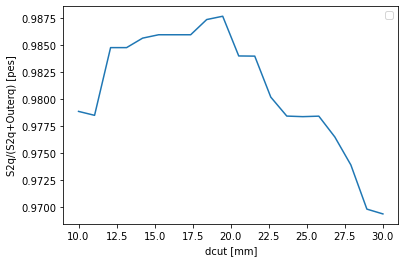

In [92]:
s2_charge = np.array(s2_charge)
outer_charge = np.array(outer_charge)
plt.plot(dcuts, s2_charge/(s2_charge + outer_charge))#, label='S2')
#plt.plot(dcuts, outer_charge, label='Outer')
plt.xlabel('dcut [mm]')
plt.ylabel('S2q/(S2q+Outerq) [pes]')
plt.legend()
#plt.yscale('log')
plt.show()

# Using PMAPs took event by event

In [5]:
data_dir = '/Users/taylorcontreras/Development/Research/nz_studies/data/trigger1/8088/pmaps/'
files = glob.glob(data_dir+'*.h5')
files.sort()

dbpmt  = DataPMT ("new", 8088)
dbsipm = DataSiPM("new", 8088)

In [7]:
pmaps = pmaps_io.load_pmaps(files[0])
events = list(pmaps.keys())

In [8]:
# Good events found with kdsts, R<100, 1 S1 and 1 S2, within energy range
good_events_str = '[  2  12  13  27  31  32  37  45  55  60  69  73  77  85  86  91  92 102  ' \
 '111 113 117 118 132 136 137 145 150 155 158 159 165 166 167 168 174 190  ' \
 '191 192 193 203 204 209 215 236 244 248 249 250 258 262 267 287 292 303  ' \
 '310 312 326 334 344 346 349 359 362 376 378 398 399 401 410 412 419 421  ' \
 '424 426 430 437 439 450 454 455 462 468 469 470 474 491 499 503 505 508  ' \
 '511 519 524 525 527 530 536 539 552 572 576 578 588 602 614 616 617 620  ' \
 '634 636 640 647 652 657 677 680 689 693 695 699 708 711 712 713 717 732  ' \
 '739 747 751 753 763 764 769 770 780 ]'

good_events = []
for s in good_events_str.split(' ')[1:-1]:
    if s != '':
        good_events.append(int(s))
matched_events = np.intersect1d(events, good_events)

In [9]:
x_str = '[-2.57653164e+01 -9.03745337e+01 -8.61973251e+01 -2.01517266e+01  ' \
 '-2.21357936e+01 -3.02787311e+01  9.71378249e+01 -8.30450962e+00  ' \
  '3.22275354e+01 -2.72406047e+01  3.29972026e+01 -5.36985700e+01  ' \
 '-5.24784658e+01  3.56382149e+00 -1.87352174e+01 -5.23677378e+01  ' \
  '4.99684009e+01  1.29229203e+01 -2.49823944e+01 -1.33081498e+01  ' \
  '1.55538587e+01 -6.47001622e+00  2.80183942e+01 -2.25793846e+01  ' \
  '4.36665206e+01  1.57687699e+01 -3.56529210e+01  5.64675986e+01  ' \
  '4.25530028e+01  8.38085924e-01 -3.75168383e+01 -5.69281552e+00  ' \
 '-5.53514855e+01 -3.30456620e+00 -7.77189696e+00 -3.73909709e+01  ' \
 '-1.69868205e+01 -2.98539102e+01 -5.23203261e+01 -3.50716577e+01  ' \
 '-7.18615398e+01 -2.03141149e+01 -2.13419608e+01 -5.16055816e+01  ' \
 '-3.54756556e+01  4.15947742e+01  1.96350490e+01 -6.31727626e+01  ' \
 '-9.84966677e+00 -6.16825086e+01  1.39467245e+01  2.19120143e+01  ' \
 '-7.59305400e-01  3.23869862e+01 -2.82114404e+01 -7.04813244e+01  ' \
 '-5.08678009e+01  2.86608644e+01 -7.27738712e+01 -8.84702507e+01  ' \
  '7.87474072e+01 -7.64832370e+01  5.83216024e+00  5.00055336e+01  ' \
  '5.75784317e+00  4.92832303e+01 -7.82710708e+01 -7.69667215e+01  ' \
 '-2.60669775e+01  5.24608368e+01 -4.62464659e+01 -6.88656953e+01  ' \
 '-3.74633647e+01 -2.28732002e+01  5.86329764e+01 -1.11847416e+00  ' \
 '-3.14027535e+01 -4.47118422e+01  5.90356080e+01  6.56419531e+01  ' \
  '2.45484171e+00  2.74348975e+01  2.23849408e+01 -1.16333613e+01  ' \
  '5.88275734e+01  3.22049636e+01 -4.62007651e+01  9.53728040e+01  ' \
 '-5.60198032e+01  3.10500195e+01  4.13149862e+00  3.90476564e+01  ' \
  '6.09957971e+01  4.03450850e+01 -4.42602335e+01 -3.42308729e+01  ' \
 '-4.49284606e+01  9.22636191e+01  1.14133874e+01 -2.18075626e+01  ' \
  '7.98265948e+00  4.50702120e+01  9.69084446e-02  8.23356193e+01  ' \
 '-8.24129788e+01  1.09263667e+01  2.36707494e+01 -1.52086014e+01  ' \
 '-6.87928526e+01  3.86756249e+01  4.88181083e+01  1.24594192e+01  ' \
  '2.76242224e+01 -3.15022732e+01  3.16496892e+01 -9.36289979e+01  ' \
 '-5.66417482e+01 -7.82610637e+01  4.58624660e+01 -9.63310406e+01  ' \
  '3.58934975e+01  7.05955729e+01 -2.25651988e+01 -4.99701577e+01  ' \
 '-1.43786634e+01 -7.90503374e+00 -5.60727849e+01  6.02662085e+01  ' \
 '-2.20259306e+01  8.32519952e+01 -1.13679438e+01  1.84820514e+01  ' \
  '6.27323112e+01 -7.29970842e+01  5.61929512e+00  ]'

y_str = '[ -5.3482163   14.6055705  -17.92299198  29.99938182  15.15595169  ' \
  '-28.04529492  20.18714503 -30.94199868  10.67300565 -88.29115601  ' \
  '31.49302364  66.98003063  74.47171986  67.26928308  -4.1948209  ' \
  '-79.00534819  56.23630687 -61.49963376  53.31486276  85.06869781  ' \
  '28.43803514  91.37172207  65.32759778 -94.40195268 -64.66026135  ' \
  '-66.26184489   8.18923509  -3.75129169 -56.23158558  -2.693165  ' \
  '-67.61965478  -3.64598157  55.21133958  22.89165321 -82.68768286  ' \
  '91.35570776  37.65565186 -61.84826643  65.16236021  34.02318159  ' \
  '62.0009154  -82.59055257  -4.06318693  41.85532682  46.76279595  ' \
  '17.91639178  42.66582823  56.64315202 -64.33506551  13.32380355  ' \
  '-92.30793074 -61.13574524 -73.33750946 -12.42649353  35.14813353  ' \
  '47.41989748 -42.03818613 -81.39465785  52.24062337  42.28141431  ' \
  '52.58098363 -57.76573901   1.34914505  32.20554961   2.78501082  ' \
  '-83.25375845  39.57476008  13.71097637  47.3014603  -20.79984123  ' \
  '-36.55662207  41.64505174 -76.52192075 -62.4021957   24.99154359  ' \
  '-27.25243251 -38.32344119  -3.68567005 -77.89026908 -16.05662417  ' \
  '-89.37500096 -66.71153909 -71.32102524 -69.72589225  16.22323807  ' \
  '-41.97160824 -35.85036551   8.25967153  24.21609834 -48.83977956  ' \
  '90.05721215 -88.0426785   25.21457131  73.03694176  81.97839865  ' \
  '-39.24595163  -3.09992563  34.88236587 -66.18094437  59.04846792  ' \
  '-71.95084911  65.30651824 -61.69574288 -27.54381782  48.8905827  ' \
  '80.60573251 -93.69735182 -89.97145441  30.63460075  16.48506655  ' \
  '69.35638532  30.20929798 -33.30082626  46.91455357  -9.61613111  ' \
  '28.49483921  77.79460446  35.09551863  -6.05130728   0.77928183  ' \
  '80.22686171 -10.45817118   1.42539136 -81.28045536  74.59595778  ' \
  '70.40525689  47.16865685  58.94075031  69.235771   -48.14581256  ' \
  '-29.16933964 -27.18354134  44.42303423  57.81682322 -94.59345905  ]'

In [10]:
xs = []
for s in x_str[1:-1].split(' '):
    if s != '':
        xs.append(float(s))
ys = []
for s in y_str[1:-1].split(' '):
    if s != '':
        ys.append(float(s))
good_xs = {}
good_ys = {}
for event in range(len(good_events)):
    good_xs[good_events[event]] = xs[event]
    good_ys[good_events[event]] = ys[event]

In [11]:
pmap = pmaps[157]
print(pmap)
for s1 in pmap.s1s:
    print(s1)
for s2 in pmap.s2s:
    print(s2)


---------------------
PMap instance
---------------------
Number of S1s: 0
Number of S2s: 1


       ---------------------
       S2 instance
       ---------------------
       Number of samples: 13
       Times: [798.69104 799.51996 800.57245 801.5365  802.4947  803.5105  804.4791
805.4703  806.44257 807.4281  808.4007  809.3529  810.1494 ] µs
       Time @ max energy: 804.479125
       Width: 12.025 µs
       Height: 2038.08642578125 pes
       Energy: 11281.4814453125 pes
       Charge: 2757.626953125 pes
       RMS: 2.119519775390625 µs



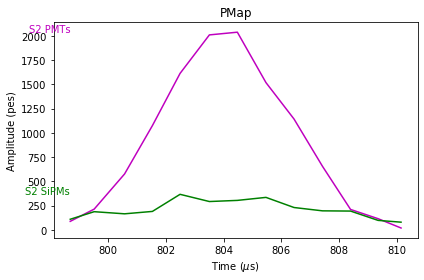

In [12]:
plt.figure()

for s1 in pmap.s1s:
    plt.plot(s1.times / 1e3, s1.pmts.sum_over_sensors * 100, c="r")
    plt.text(s1.times.max() / 1e3, s1.pmts.sum_over_sensors.max() * 100, "S1 x 100", color="r")

for s2 in pmap.s2s:
    plt.plot(s2.times / 1e3, s2.pmts.sum_over_sensors, c="m")
    plt.plot(s2.times / 1e3, s2.sipms.sum_over_sensors, c="g")
    plt.text(s2.times.min() / 1e3, s2.pmts.sum_over_sensors.max(), "S2 PMTs", color="m", ha="right")
    plt.text(s2.times.min() / 1e3, s2.sipms.sum_over_sensors.max(), "S2 SiPMs", color="g", ha="right")

plt.xlabel("Time ($\mu$s)")
plt.ylabel("Amplitude (pes)")
plt.title("PMap")
plt.tight_layout()

Text(0.5, 1.0, 'PMTs')

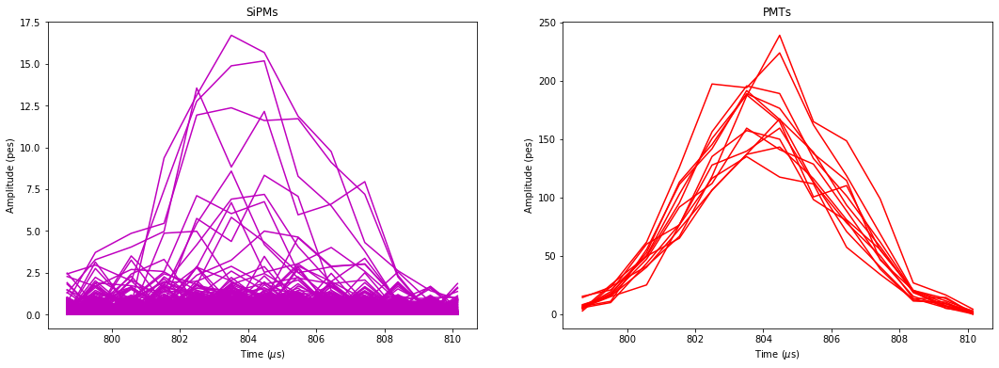

In [13]:
fig = plt.figure(figsize=(18,6))
plt.subplot(1,2,1)
for s2 in pmap.s2s:
    for sipm in s2.sipms.all_waveforms:
        plt.plot(s2.times / 1e3, sipm, c="m")
    #plt.text(s2.times.min() / 1e3, sipm.max(), "S2 PMTs", color="m", ha="right")
plt.xlabel("Time ($\mu$s)")
plt.ylabel("Amplitude (pes)")
plt.title("SiPMs")
#plt.tight_layout()

plt.subplot(1,2,2)
for s2 in pmap.s2s:
    for pmt in s2.pmts.all_waveforms:
        plt.plot(s2.times / 1e3, pmt, c="r")
    #plt.text(s2.times.min() / 1e3, pmt.max(), "S2 PMTs", color="r", ha="right")
plt.xlabel("Time ($\mu$s)")
plt.ylabel("Amplitude (pes)")
plt.title("PMTs")
#plt.tight_layout()

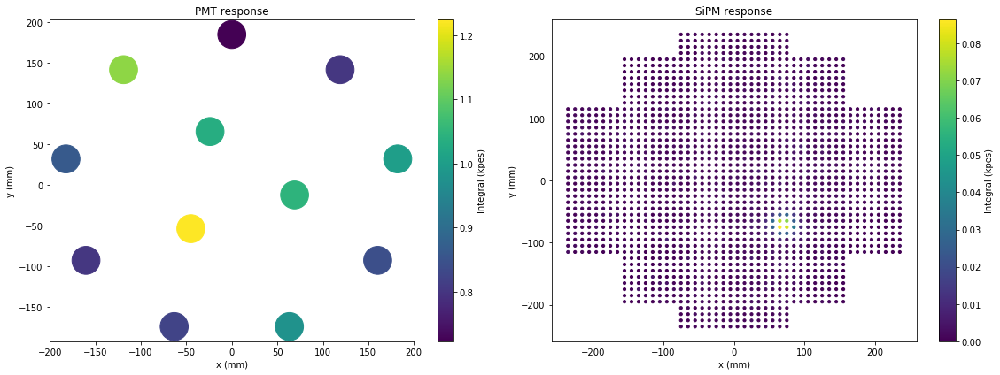

In [341]:
event = events[0]
pmap = pmaps[event]
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.scatter(dbpmt.X, dbpmt.Y, s=1000, c=pmap.s2s[0].pmts.sum_over_times/1e3)
plt.xlabel("x (mm)")
plt.ylabel("y (mm)")
plt.colorbar().set_label("Integral (kpes)")
plt.title("PMT response")

plt.subplot(1, 2, 2)
ids = pmap.s2s[0].sipms.ids
plt.scatter(dbsipm.X[ids], dbsipm.Y[ids], s=10, c=pmap.s2s[0].sipms.sum_over_times/1e3)
plt.xlabel("x (mm)")
plt.ylabel("y (mm)")
plt.colorbar().set_label("Integral (kpes)")
plt.title("SiPM response")

plt.tight_layout()

In [20]:
sipm_xs    = dbsipm.X.values
sipm_ys    = dbsipm.Y.values
sipm_xys   = np.stack((sipm_xs, sipm_ys), axis=1)

xys = sipm_xys[pmap.s2s[0].sipms.ids]
event_corona = xya.corona(xys, pmap.s2s[0].sipms.sum_over_times, dbsipm,
                           Qthr            =  0 * units.pes,
                           Qlm             =  0 * units.pes,
                           lm_radius       =  0  * units.mm , # must be 0
                           new_lm_radius   =  15 * units.mm , # must be 10mm*sqrt(2) or some number slightly larger
                           msipm           =  3,
                           consider_masked = True)[0] # get first entry, max charge

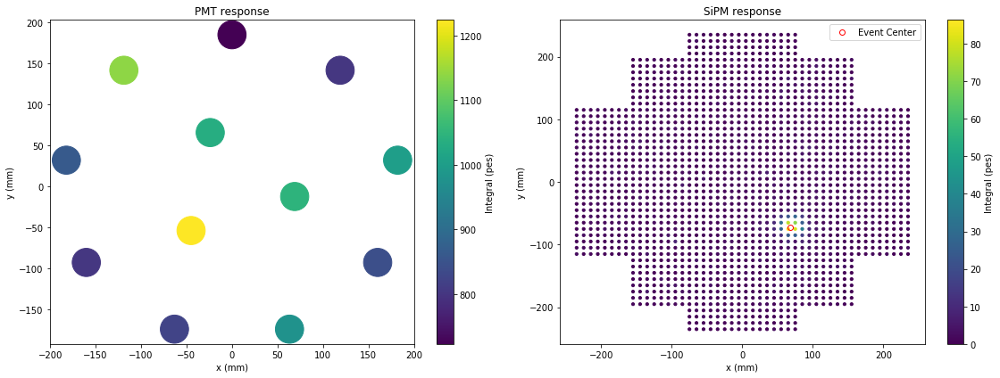

In [21]:
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.scatter(dbpmt.X, dbpmt.Y, s=1000, c=pmap.s2s[0].pmts.sum_over_times)
plt.xlabel("x (mm)")
plt.ylabel("y (mm)")
plt.colorbar().set_label("Integral (pes)")
plt.title("PMT response")

plt.subplot(1, 2, 2)
ids = pmap.s2s[0].sipms.ids
plt.scatter(dbsipm.X[ids], dbsipm.Y[ids], s=10, c=pmap.s2s[0].sipms.sum_over_times)
plt.plot(event_corona.XY[0], event_corona.XY[1], 'o', color='red', label='Event Center',fillstyle='none')
plt.xlabel("x (mm)")
plt.ylabel("y (mm)")
plt.legend()
plt.colorbar().set_label("Integral (pes)")
plt.title("SiPM response")

plt.tight_layout()

Text(0.5, 1.0, 'SiPM response')

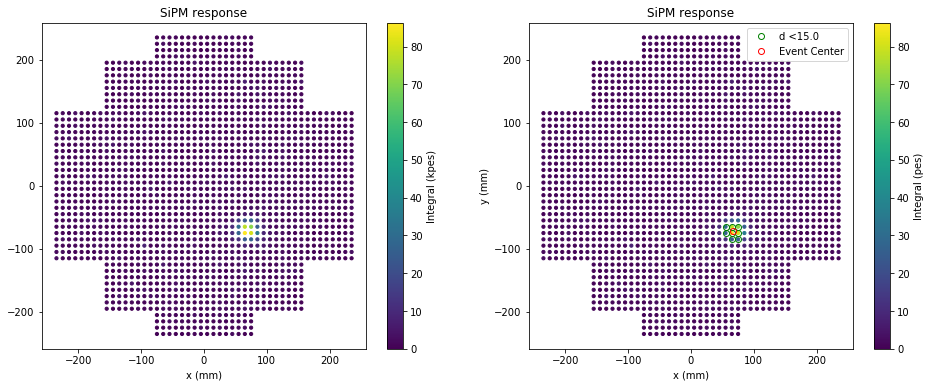

In [22]:
dcut = 15. #mm
ids = pmap.s2s[0].sipms.ids

plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.scatter(dbsipm.X[ids], dbsipm.Y[ids], s=10, c=pmap.s2s[0].sipms.sum_over_times)
plt.xlabel("x (mm)")
plt.colorbar().set_label("Integral (kpes)")
plt.title("SiPM response")

plt.subplot(1, 2, 2)
plt.scatter(dbsipm.X[ids], dbsipm.Y[ids], s=10, c=pmap.s2s[0].sipms.sum_over_times)
sipms_d = xys[xya.get_nearby_sipm_inds(event_corona.XY, dcut, xys)]
plt.plot(sipms_d[:,0], sipms_d[:,1], 'o', color='g', fillstyle='none', label='d <'+str(dcut))
plt.plot(event_corona.XY[0], event_corona.XY[1], 'o', color='red', label='Event Center',fillstyle='none')
plt.xlabel("x (mm)")
plt.ylabel("y (mm)")
plt.legend()
plt.colorbar().set_label("Integral (pes)")
plt.title("SiPM response")

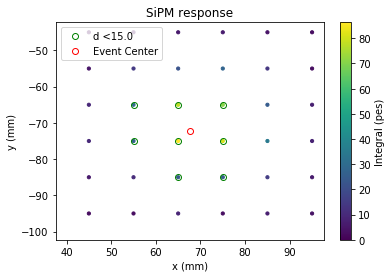

In [23]:
#plt.subplot(1, 2, 2)
plt.scatter(dbsipm.X[ids], dbsipm.Y[ids], s=10, c=pmap.s2s[0].sipms.sum_over_times)
sipms_d = xys[xya.get_nearby_sipm_inds(event_corona.XY, dcut, xys)]
plt.plot(sipms_d[:,0], sipms_d[:,1], 'o', color='g', fillstyle='none', label='d <'+str(dcut))
plt.plot(event_corona.XY[0], event_corona.XY[1], 'o', color='red', label='Event Center',fillstyle='none')
plt.xlabel("x (mm)")
plt.ylabel("y (mm)")
plt.xlim(event_corona.XY[0]-dcut*2, event_corona.XY[0]+dcut*2)
plt.ylim(event_corona.XY[1]-dcut*2, event_corona.XY[1]+dcut*2)
plt.legend()
plt.colorbar().set_label("Integral (pes)")
plt.title("SiPM response")
plt.show()

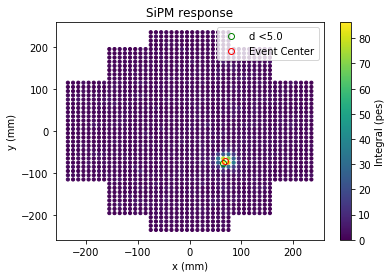

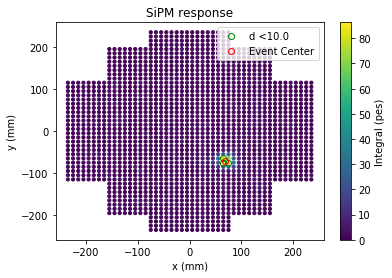

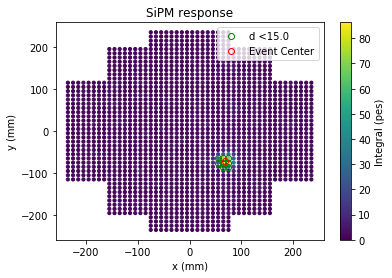

In [143]:
dcuts = [5.,10.,15.]
xys = sipm_xys[pmap.s2s[0].sipms.ids]
coronas_dcuts = []
for dcut in dcuts:
    event_corona = xya.corona(xys, pmap.s2s[0].sipms.sum_over_times, dbsipm,
                               Qthr            =  0 * units.pes,
                               Qlm             =  0 * units.pes,
                               lm_radius       =  0  * units.mm , # must be 0
                               new_lm_radius   =  15 * units.mm , # must be 10mm*sqrt(2) or some number slightly larger
                               msipm           =  3,
                               consider_masked = True)[0] # get first entry, max charge
    coronas_dcuts.append(event_corona)
    
    plt.scatter(dbsipm.X[ids], dbsipm.Y[ids], s=10, c=pmap.s2s[0].sipms.sum_over_times)
    sipms_d = xys[xya.get_nearby_sipm_inds(event_corona.XY, dcut, xys)]
    plt.plot(sipms_d[:,0], sipms_d[:,1], 'o', color='g', fillstyle='none', label='d <'+str(dcut))
    plt.plot(event_corona.XY[0], event_corona.XY[1], 'o', color='red', label='Event Center',fillstyle='none')
    plt.xlabel("x (mm)")
    plt.ylabel("y (mm)")
    plt.legend()
    plt.colorbar().set_label("Integral (pes)")
    plt.title("SiPM response")
    plt.show()

In [73]:
dcuts = np.arange(5,200,10)
xys = sipm_xys[pmap.s2s[0].sipms.ids]
coronas_dcuts = []
nsipms = []
Q = []
for dcut in dcuts:
    event_corona = xya.corona(xys, pmap.s2s[0].sipms.sum_over_times, dbsipm,
                               Qthr            =  0 * units.pes,
                               Qlm             =  0 * units.pes,
                               lm_radius       =  0  * units.mm , # must be 0
                               new_lm_radius   =  15 * units.mm , # must be 10mm*sqrt(2) or some number slightly larger
                               msipm           =  3,
                               consider_masked = True)[0] # get first entry, max charge
    coronas_dcuts.append(event_corona)
    sipms_d = xya.get_nearby_sipm_inds(event_corona.XY, dcut, xys)
    nsipms.append(len(sipms_d))
    Q.append(sum([pmap.s2s[0].sipms.sum_over_times[i] for i in sipms_d]))
Q = np.array(Q)
nsipms = np.array(nsipms)

Text(0.5, 1.0, 'SiPMs < d from central SiPM')

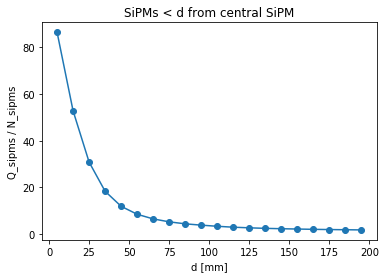

In [74]:
plt.plot(dcuts, Q/nsipms, '-o')
plt.xlabel('d [mm]')
plt.ylabel('Q_sipms / N_sipms')
plt.title('SiPMs < d from central SiPM')

In [359]:
nevents = len(matched_events)
dcuts = np.arange(5,200,10)
nsipms = np.zeros_like(dcuts)
Q = np.zeros_like(dcuts)
for evt in range(nevents):
    event = matched_events[evt]
    #print('Event '+str(event))
    pmap = pmaps[event]
    xys = sipm_xys[pmap.s2s[0].sipms.ids]
    
    XY = (good_xs[event], good_ys[event])
    
    this_q = []
    this_nsipm = []
    for dcut in range(len(dcuts)):
        sipms_d = xya.get_nearby_sipm_inds(XY, dcuts[dcut], xys)
        this_nsipm.append(len(sipms_d))
        this_q.append(sum([pmap.s2s[0].sipms.sum_over_times[i] for i in sipms_d]))
    Q = Q + np.array(this_q)
    nsipms = nsipms + np.array(this_nsipm)
Q = Q/nevents
nsipms = nsipms/nevents

Text(0.5, 1.0, 'Q_sipms = charge from SiPMs < d from event center')

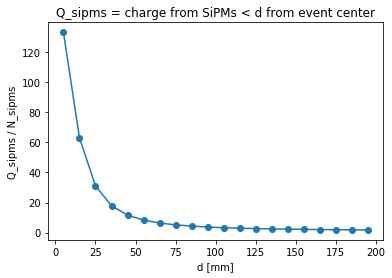

In [360]:
plt.plot(dcuts, Q/nsipms, '-o')
plt.xlabel('d [mm]')
plt.ylabel('Q_sipms / N_sipms')
plt.title('Q_sipms = charge from SiPMs < d from event center')

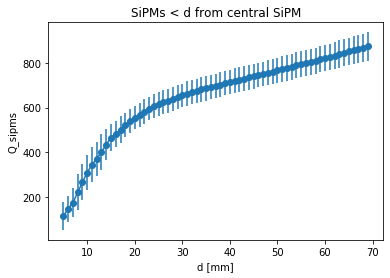

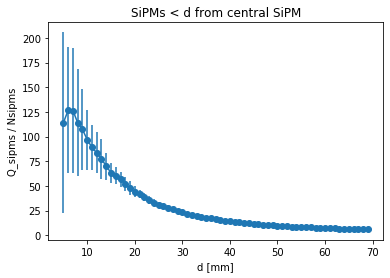

In [212]:
nevents = len(matched_events)
dcuts = np.arange(5,70,1)
nsipms = {dcut:[] for dcut in dcuts}
Q = {dcut:[] for dcut in dcuts}
Q_N = {dcut:[] for dcut in dcuts}
for evt in range(nevents):
    event = matched_events[evt]
    #print('Event '+str(event))
    pmap = pmaps[event]
    xys = sipm_xys[pmap.s2s[0].sipms.ids]
    
    XY = (good_xs[event], good_ys[event])
    
    for dcut in range(len(dcuts)):
        sipms_d = xya.get_nearby_sipm_inds(XY, dcuts[dcut], xys)
        q = sum([pmap.s2s[0].sipms.sum_over_times[i] for i in sipms_d])
        n = len(sipms_d)
        nsipms[dcuts[dcut]].append(n)
        Q[dcuts[dcut]].append(q)
        if q == 0:
            Q_N[dcuts[dcut]].append(0)
        else:
            Q_N[dcuts[dcut]].append(q/n)

Q_var = []
Q_mean = []
Nsipm_var = []
Nsipm_mean = []
Q_N_mean = []
Q_N_var = []
for dcut in dcuts:
    q_var = np.var(Q[dcut])
    Q_var.append(q_var)
    q_mean = np.mean(Q[dcut])
    Q_mean.append(q_mean)
    nsipm_var = np.var(nsipms[dcut])
    Nsipm_var.append(nsipm_var)
    nsipm_mean = np.mean(nsipms[dcut])
    Nsipm_mean.append(nsipm_mean)
    
    q_n_var = q_var/nsipm_mean**2 + nsipm_var * q_mean**2 / nsipm_mean**4
    Q_N_var.append(q_n_var)
    Q_N_mean.append(np.mean(Q_N[dcut]))

plt.errorbar(dcuts, Q_mean, yerr=np.sqrt(Q_var), marker='o')
plt.xlabel('d [mm]')
plt.ylabel('Q_sipms')
plt.title('SiPMs < d from central SiPM')
plt.show()

plt.errorbar(dcuts, Q_N_mean, yerr=np.sqrt(Q_N_var), marker='o')
plt.xlabel('d [mm]')
plt.ylabel('Q_sipms / Nsipms')
plt.title('SiPMs < d from central SiPM')
plt.show()

In [217]:
nevents = len(matched_events)
dcuts = np.arange(5,70,10)
nsipms = {dcut:[] for dcut in dcuts}
Q = {dcut:[] for dcut in dcuts}
for evt in range(nevents):
    event = matched_events[evt]
    
    pmap = pmaps[event]
    xys = sipm_xys[pmap.s2s[0].sipms.ids]
    
    XY = (good_xs[event], good_ys[event])
    
    for dcut in range(len(dcuts)):
        sipms_d = xya.get_nearby_sipm_inds(XY, dcuts[dcut], xys)
        nsipms[dcuts[dcut]].append(len(sipms_d))
        Q[dcuts[dcut]].append(sum([pmap.s2s[0].sipms.sum_over_times[i] for i in sipms_d]))


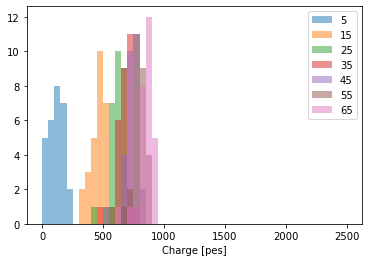

In [219]:
for dcut in dcuts:
    plt.hist(Q[dcut], bins=50, range=(0,2500), alpha=0.5, label=str(dcut))
    plt.xlabel('Charge [pes]')
plt.legend()
plt.show()

In [224]:
for evt in pmaps.keys():
    pmap = pmaps[evt]
    sipms = pmap.s2s[0].sipms.sum_over_times
    print(len(sipms[sipms>0]))

1766
1756
1733
1772
1769
1732
1780
1757
1755
1751
1781
1760
1763
1777
1723
1769
1769
1743
1776
1780
1782
1750
1766
1760
1752
1770
1778
1776
1781
1777
1758
1767
1767
1760
1777
1772
1782
1765
1732
1768
1772
1770
1781
1775
1715
1784
1773
1701
1721
1707
1777
1753
1785
1739
1776
1759
1765
1766
1777
1721
1776
1785
1772
1781
1784
1775
1778
1774
1784
1771
1699
1769
1766
1756
1777
1755
1745
1757
1733
1773
1754
1775
1779
1777
1774
1777
1755
1744
1749
1763
1775
1716
1782
1783
1765
1776
1766
1782
1775
1764
1766
1779
1761
1743
1776
1738
1752
1774
1783
1768
1781
1776
1782
1778
1747
1717
1773
1783
1719
1774
1765
1749
1784
1781
1719
1745
1768
1778
1761
1775
1776
1782
1763
1783
1781
1784
1756
1780
1756
1752
1782
1779
1784
1782
1774
1783
1775
1754
1744
1779
1772
1779
1756
1780
1780
1755


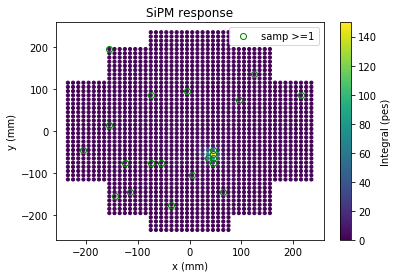

In [248]:
event = matched_events[0]
pmap = pmaps[event]
samp_thresh = 1
int_thresh = 0
tslice = 0
for s2 in pmap.s2s:
    sipms_kept = np.argwhere(s2.sipms.all_waveforms[:,tslice] > samp_thresh)[:,0]
    
    xys = sipm_xys[sipms_kept]
    XY = (good_xs[event], good_ys[event])
    
    plt.scatter(dbsipm.X[ids], dbsipm.Y[ids], s=10, c=pmap.s2s[0].sipms.sum_over_times)
    sipms_d = xys[xya.get_nearby_sipm_inds(event_corona.XY, dcut, xys)]
    plt.plot(xys[:,0], xys[:,1], 'o', color='g', fillstyle='none', label='samp >='+str(samp_thresh))
    #plt.plot(event_corona.XY[0], event_corona.XY[1], 'o', color='red', label='Event Center',fillstyle='none')
    plt.xlabel("x (mm)")
    plt.ylabel("y (mm)")
    plt.legend()
    plt.colorbar().set_label("Integral (pes)")
    plt.title("SiPM response")
    plt.show()

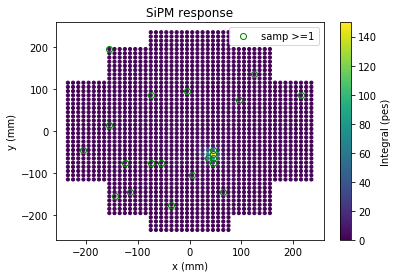

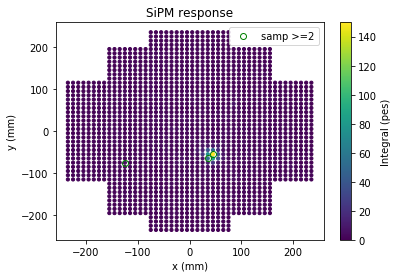

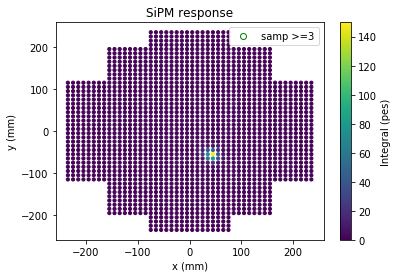

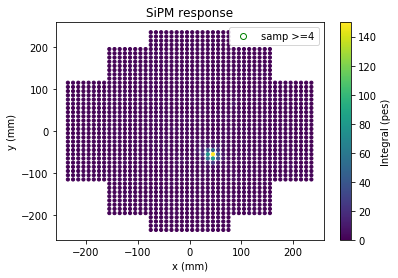

In [249]:
event = matched_events[0]
pmap = pmaps[event]
samp_thresh = 1
int_thresh = 0
tslice = 0
samp_thresholds = [1,2,3,4]
for samp_thresh in samp_thresholds:
    for s2 in pmap.s2s:
        sipms_kept = np.argwhere(s2.sipms.all_waveforms[:,tslice] > samp_thresh)[:,0]

        xys = sipm_xys[sipms_kept]
        XY = (good_xs[event], good_ys[event])

        plt.scatter(dbsipm.X[ids], dbsipm.Y[ids], s=10, c=pmap.s2s[0].sipms.sum_over_times)
        sipms_d = xys[xya.get_nearby_sipm_inds(event_corona.XY, dcut, xys)]
        plt.plot(xys[:,0], xys[:,1], 'o', color='g', fillstyle='none', label='samp >='+str(samp_thresh))
        #plt.plot(event_corona.XY[0], event_corona.XY[1], 'o', color='red', label='Event Center',fillstyle='none')
        plt.xlabel("x (mm)")
        plt.ylabel("y (mm)")
        plt.legend()
        plt.colorbar().set_label("Integral (pes)")
        plt.title("SiPM response")
        plt.show()

1122
149.85461


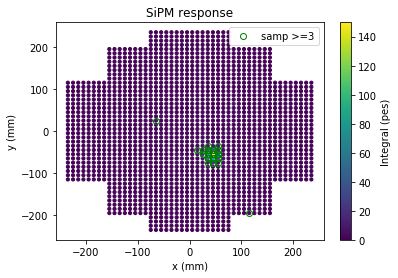

In [287]:
event = matched_events[0]
pmap = pmaps[event]
samp_thresh = 3
int_thresh = 0
tslice = 0
s2 = pmap.s2s[0]

sipms_kept = np.argwhere(s2.sipms.all_waveforms > samp_thresh)[:,0]
xys = sipm_xys[sipms_kept]
XY = (good_xs[event], good_ys[event])

plt.scatter(dbsipm.X[ids], dbsipm.Y[ids], s=10, c=pmap.s2s[0].sipms.sum_over_times)
sipms_d = xys[xya.get_nearby_sipm_inds(event_corona.XY, dcut, xys)]
plt.plot(xys[:,0], xys[:,1], 'o', color='g', fillstyle='none', label='samp >='+str(samp_thresh))
#plt.plot(event_corona.XY[0], event_corona.XY[1], 'o', color='red', label='Event Center',fillstyle='none')
plt.xlabel("x (mm)")
plt.ylabel("y (mm)")
plt.legend()
plt.colorbar().set_label("Integral (pes)")
plt.title("SiPM response")
plt.show()

-------Event 158---------


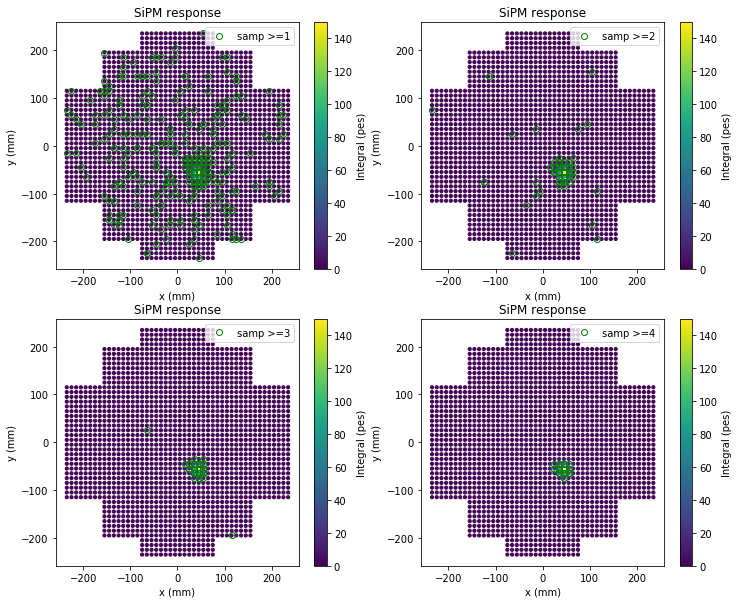

-------Event 159---------


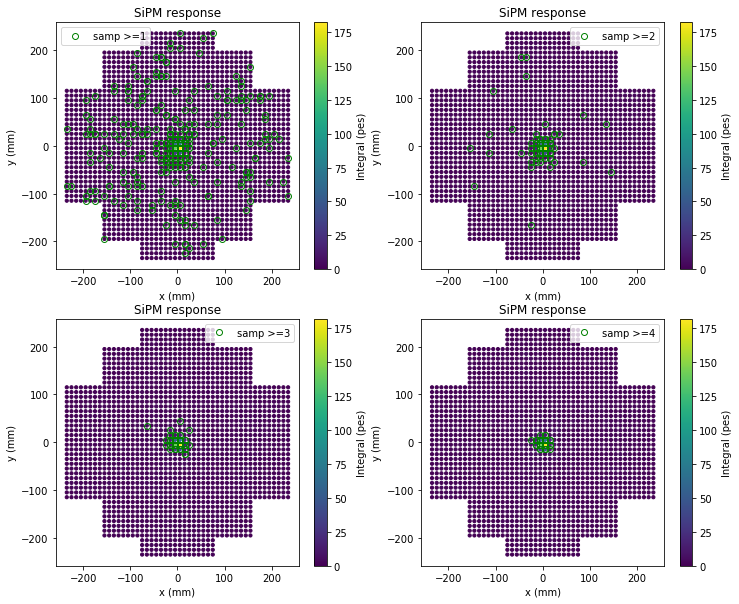

-------Event 165---------


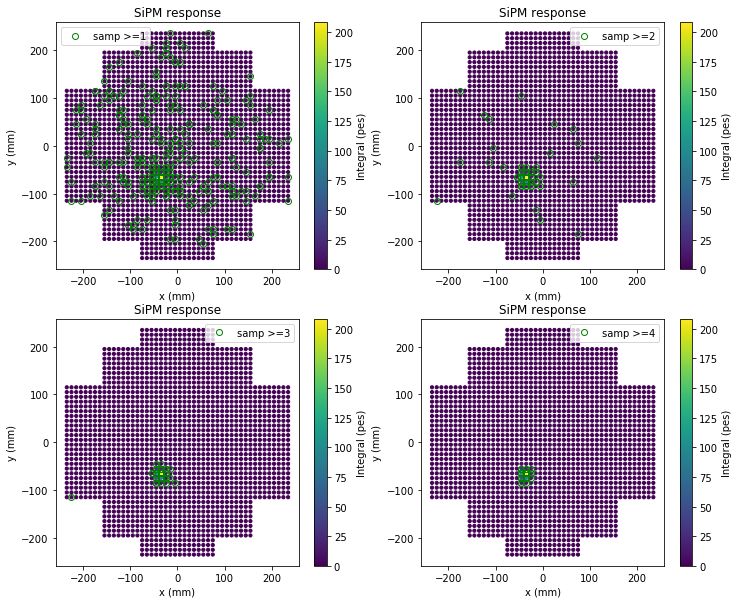

-------Event 166---------


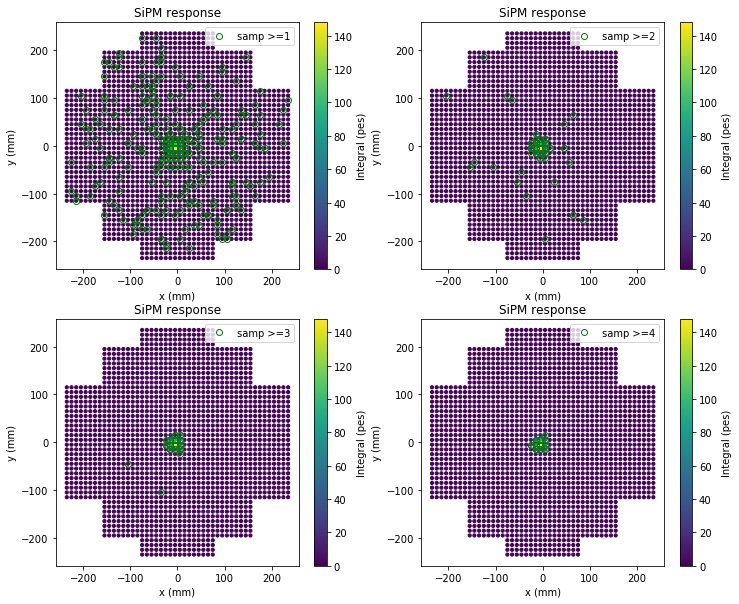

-------Event 167---------


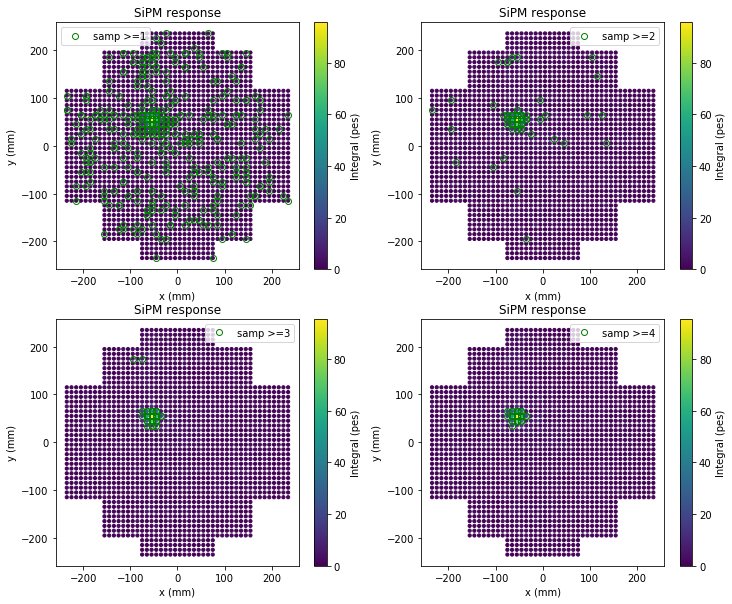

-------Event 168---------


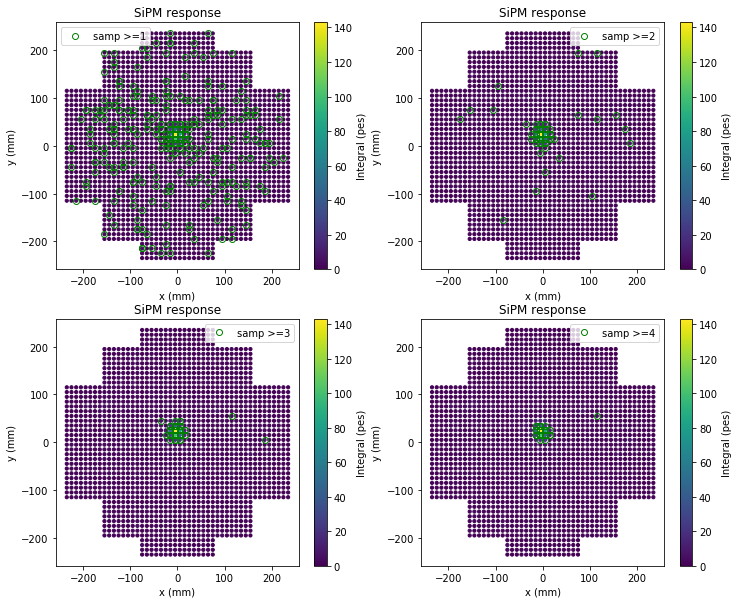

-------Event 174---------


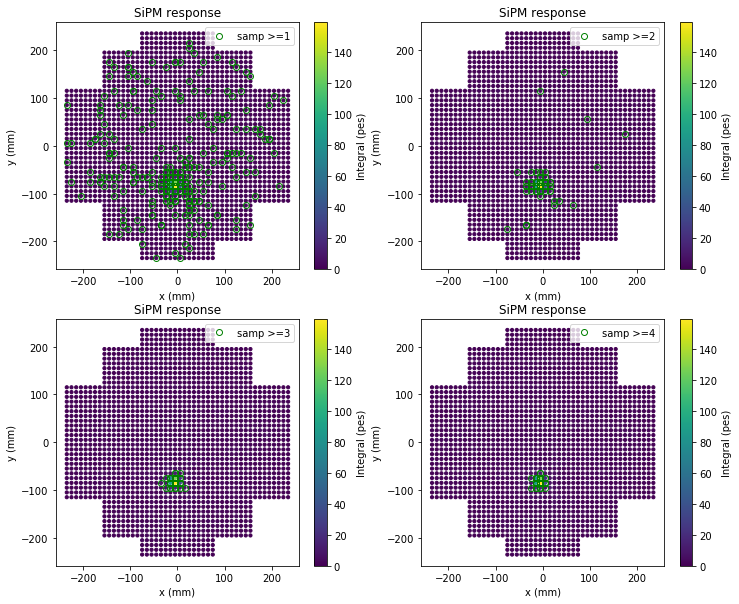

-------Event 190---------


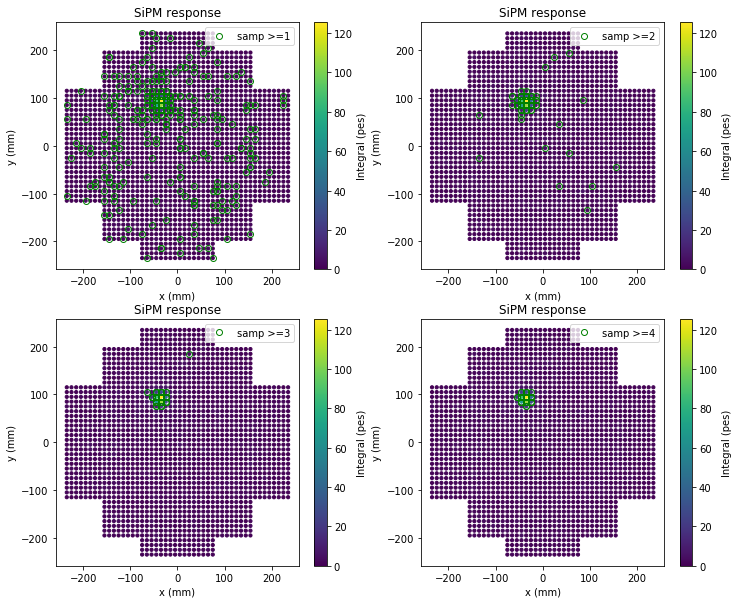

-------Event 191---------


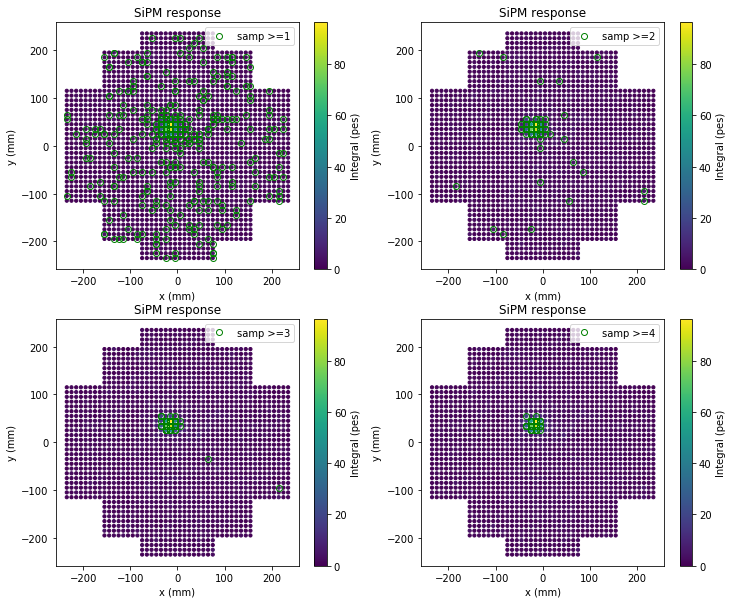

-------Event 192---------


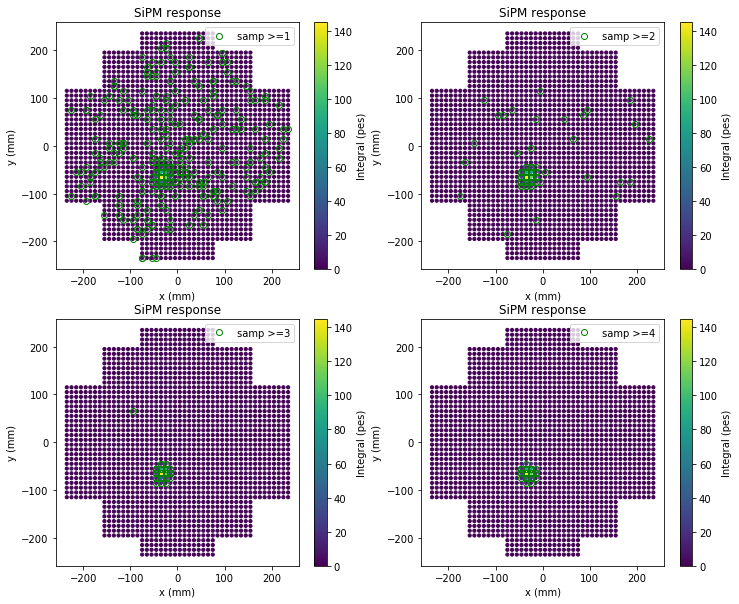

-------Event 193---------


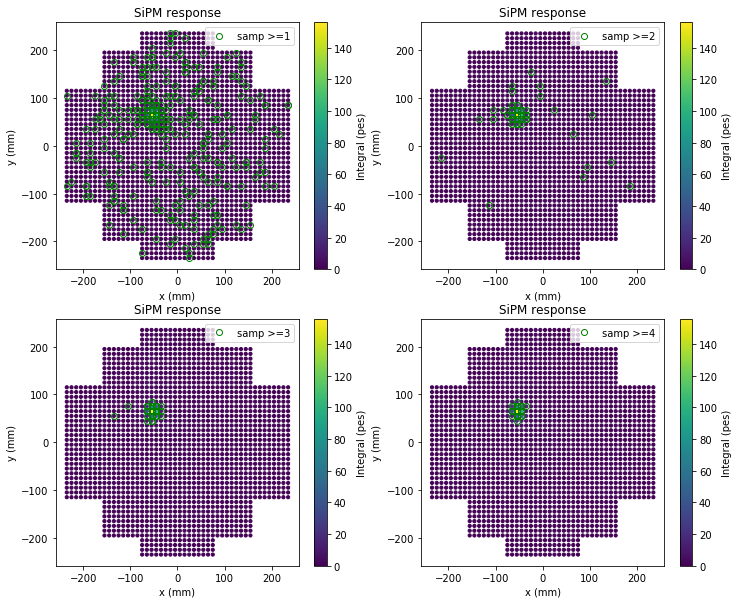

-------Event 203---------


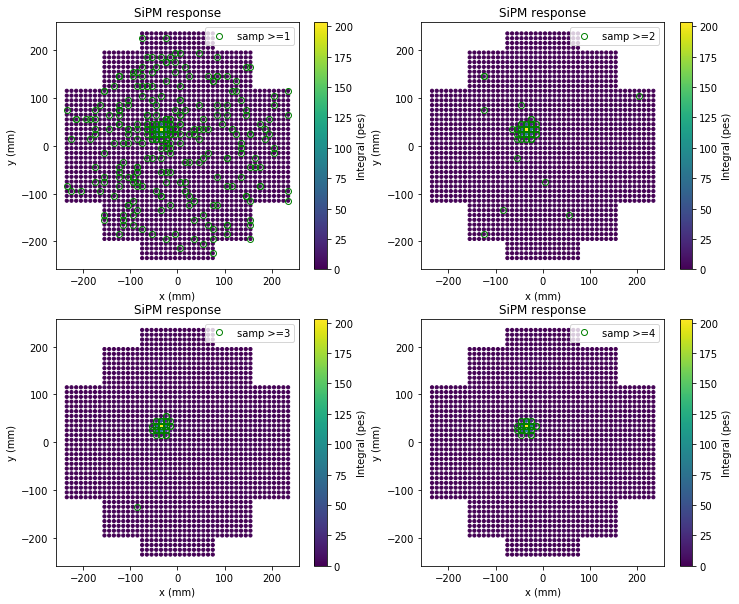

-------Event 204---------


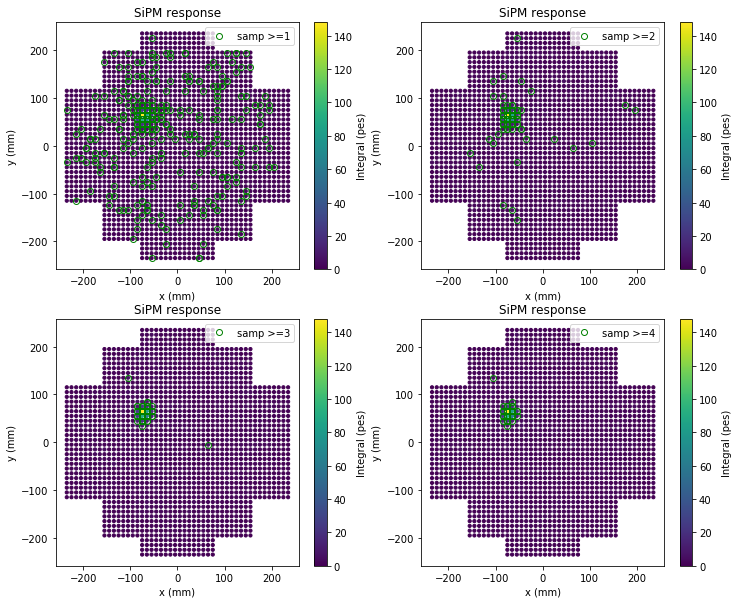

-------Event 209---------


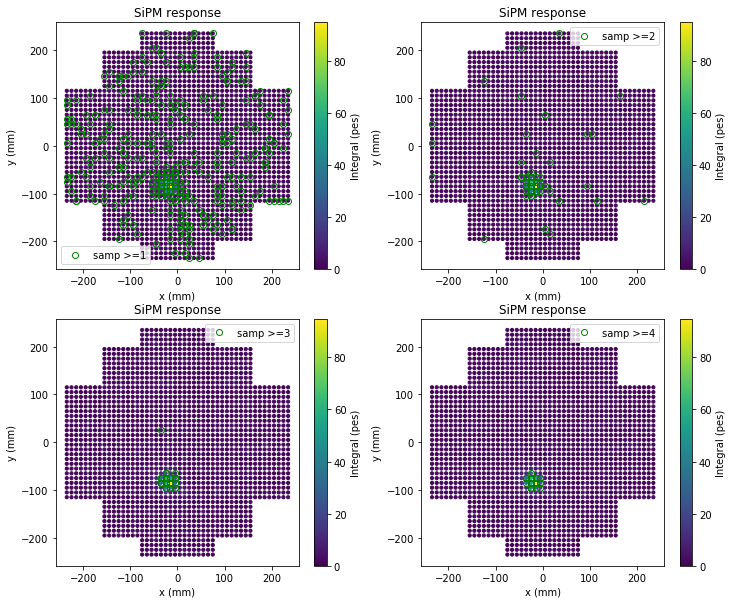

-------Event 215---------


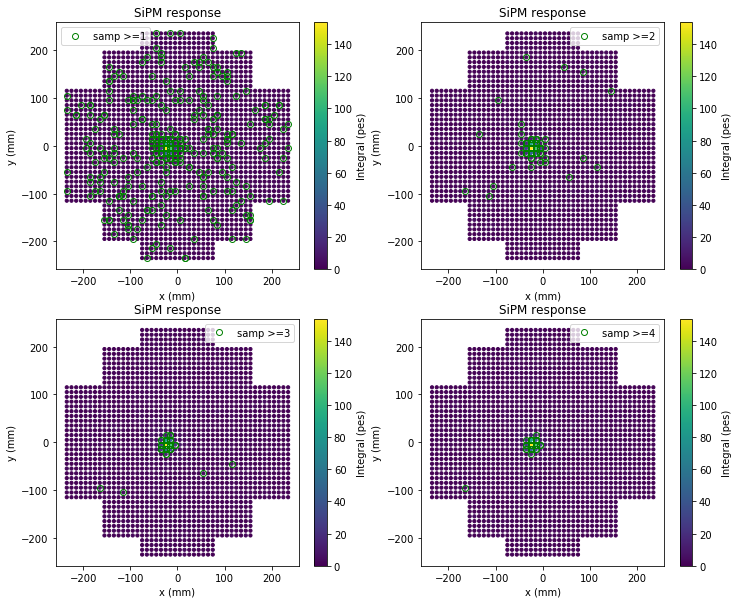

-------Event 236---------


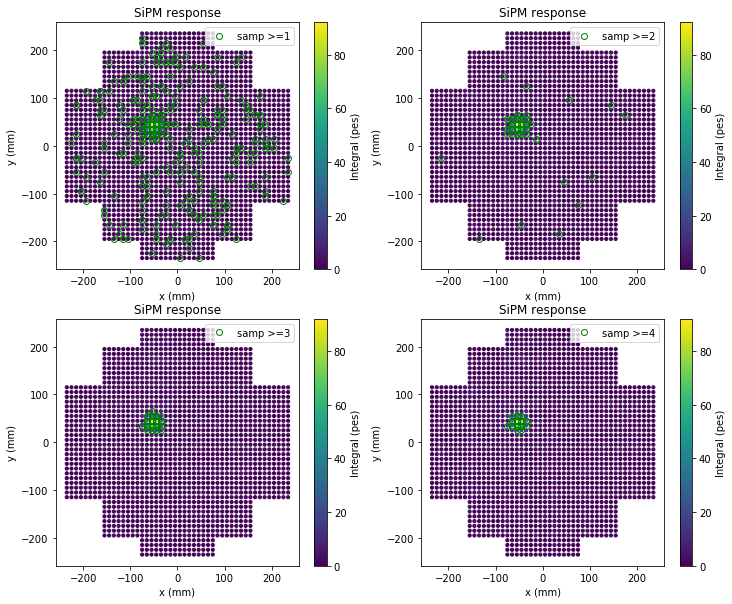

-------Event 244---------


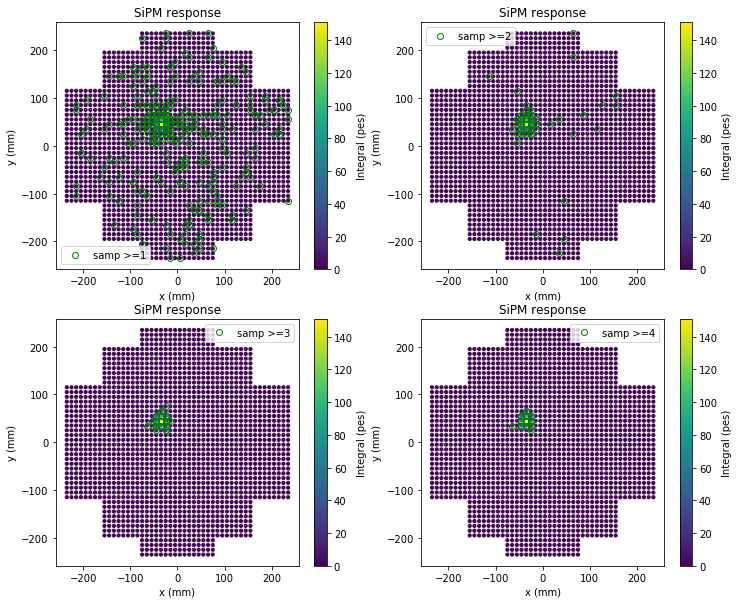

-------Event 248---------


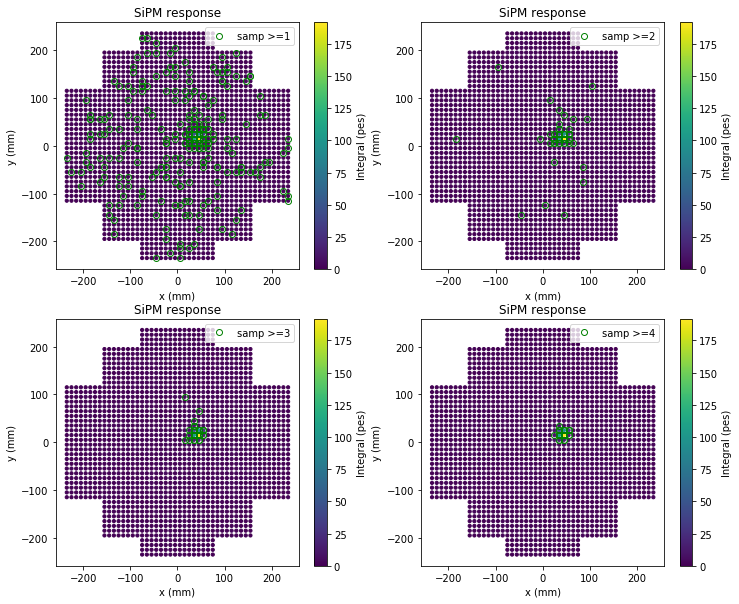

-------Event 249---------


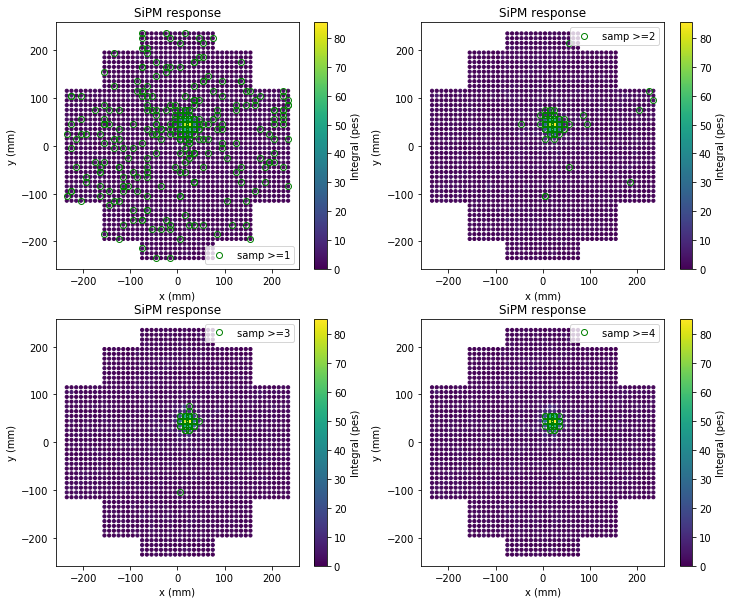

-------Event 250---------


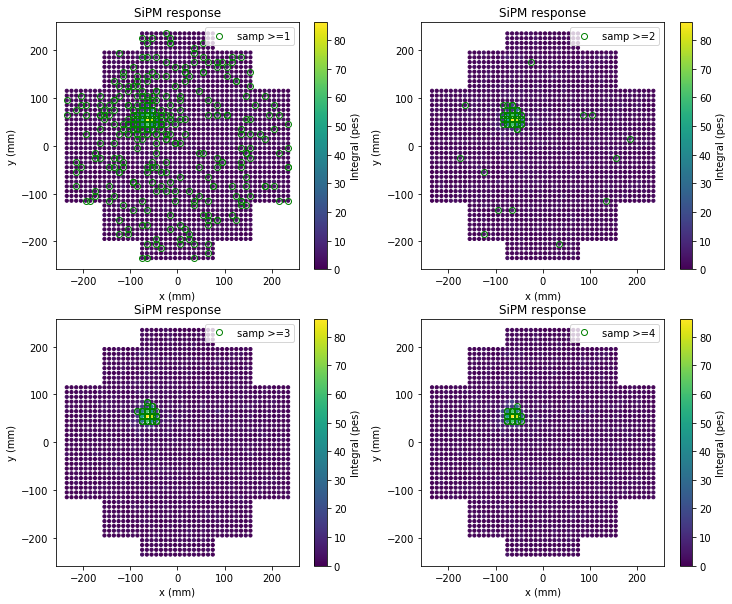

-------Event 258---------


KeyboardInterrupt: 

In [305]:
event = 5
samp_thresholds = [1,2,3,4]
for evt in range(event):
    event = matched_events[evt]
    pmap = pmaps[event]
    print('-------Event '+str(event)+'---------')
    
    i = 1
    plt.figure(figsize=(12, 10))
    for samp_thresh in samp_thresholds:
        for s2 in pmap.s2s:
            sipms_kept = np.argwhere(s2.sipms.all_waveforms > samp_thresh)[:,0]

            xys = sipm_xys[sipms_kept]
            XY = (good_xs[event], good_ys[event])
            plt.subplot(2, 2, i)
            i += 1
            plt.scatter(dbsipm.X[ids], dbsipm.Y[ids], s=10, c=pmap.s2s[0].sipms.sum_over_times)
            sipms_d = xys[xya.get_nearby_sipm_inds(event_corona.XY, dcut, xys)]
            plt.plot(xys[:,0], xys[:,1], 'o', color='g', fillstyle='none', label='samp >='+str(samp_thresh))
            #plt.plot(event_corona.XY[0], event_corona.XY[1], 'o', color='red', label='Event Center',fillstyle='none')
            plt.xlabel("x (mm)")
            plt.ylabel("y (mm)")
            plt.legend()
            plt.colorbar().set_label("Integral (pes)")
            plt.title("SiPM response")
    plt.show()

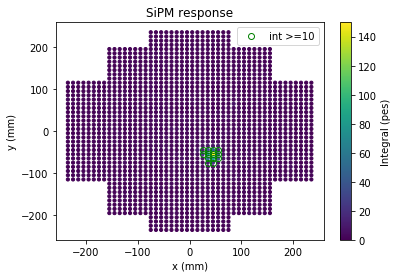

In [290]:
event = matched_events[0]
pmap = pmaps[event]
samp_thresh = 3
int_thresh = 10
tslice = 0
s2 = pmap.s2s[0]

sipms_kept = np.argwhere(s2.sipms.sum_over_times > int_thresh)[:,0]
xys = sipm_xys[sipms_kept]
XY = (good_xs[event], good_ys[event])

plt.scatter(dbsipm.X[ids], dbsipm.Y[ids], s=10, c=pmap.s2s[0].sipms.sum_over_times)
sipms_d = xys[xya.get_nearby_sipm_inds(event_corona.XY, dcut, xys)]
plt.plot(xys[:,0], xys[:,1], 'o', color='g', fillstyle='none', label='int >='+str(int_thresh))
#plt.plot(event_corona.XY[0], event_corona.XY[1], 'o', color='red', label='Event Center',fillstyle='none')
plt.xlabel("x (mm)")
plt.ylabel("y (mm)")
plt.legend()
plt.colorbar().set_label("Integral (pes)")
plt.title("SiPM response")
plt.show()

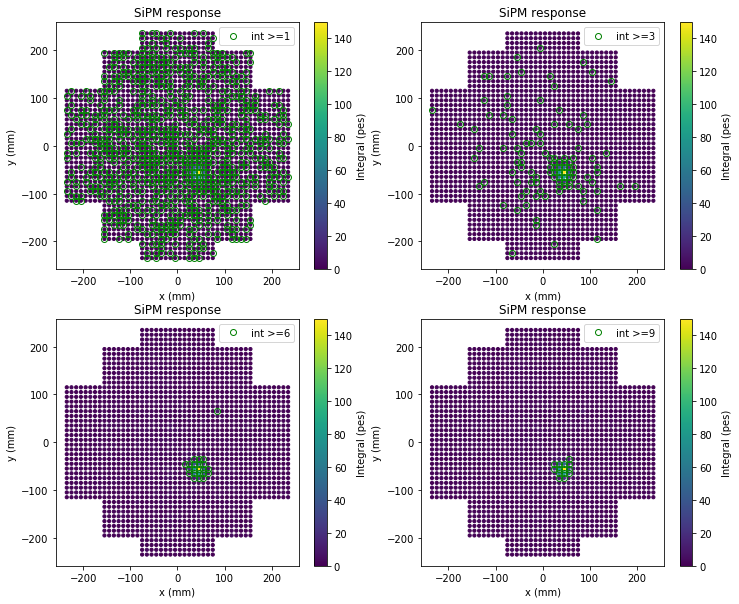

In [340]:
event = matched_events[0]
pmap = pmaps[event]
samp_thresh = 3
int_thresholds = [1,3,6,9]
s2 = pmap.s2s[0]

plt.figure(figsize=(12, 10))
i = 1
for int_thresh in int_thresholds:
    
    sipms_kept = np.argwhere(s2.sipms.sum_over_times > int_thresh)[:,0]
    xys = sipm_xys[sipms_kept]
    XY = (good_xs[event], good_ys[event])

    plt.subplot(2, 2, i)
    i += 1
    plt.scatter(dbsipm.X[ids], dbsipm.Y[ids], s=10, c=pmap.s2s[0].sipms.sum_over_times)
    sipms_d = xys[xya.get_nearby_sipm_inds(event_corona.XY, dcut, xys)]
    plt.plot(xys[:,0], xys[:,1], 'o', color='g', fillstyle='none', label='int >='+str(int_thresh))
    #plt.plot(event_corona.XY[0], event_corona.XY[1], 'o', color='red', label='Event Center',fillstyle='none')
    plt.xlabel("x (mm)")
    plt.ylabel("y (mm)")
    plt.legend()
    plt.colorbar().set_label("Integral (pes)")
    plt.title("SiPM response")
plt.show()

In [352]:
event = matched_events[0]
pmap = pmaps[event]
samp_thresholds = [0,1,2,3,4]
int_thresh = 0
Ds = {}
for samp_thresh in samp_thresholds:
    s2 = pmap.s2s[0]

    sipms_kept = np.argwhere(s2.sipms.all_waveforms > samp_thresh)[:,0]
    xys = sipm_xys[sipms_kept]
    XY = (good_xs[event], good_ys[event])

    ds = np.sqrt((xys[:,0] - XY[0])**2 + (xys[:,1] - XY[1])**2)
    Ds[samp_thresh] = ds

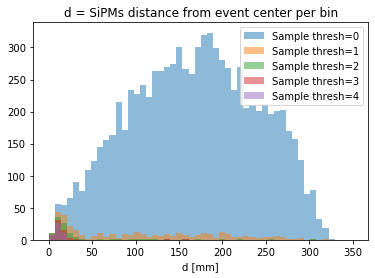

In [354]:
for samp_thresh in samp_thresholds:
    plt.hist(Ds[samp_thresh], bins = 50, range=(0,350), alpha=0.5, label='Sample thresh='+str(samp_thresh))
plt.xlabel('d [mm]')
plt.title('d = SiPMs distance from event center per bin')
plt.legend()
plt.show()

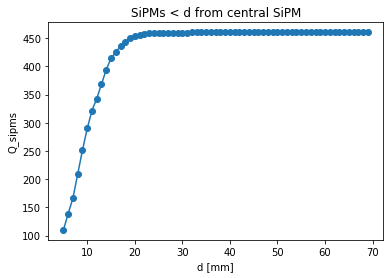

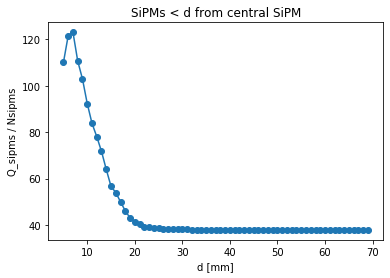

In [336]:
samp_thresh = 1

nevents = len(matched_events)
dcuts = np.arange(5,70,1)
nsipms = {dcut:[] for dcut in dcuts}
Q = {dcut:[] for dcut in dcuts}
Q_N = {dcut:[] for dcut in dcuts}
for evt in range(nevents):
    event = matched_events[evt]
    #print('Event '+str(event))
    pmap = pmaps[event]
    s2 = pmap.s2s[0]
    
    s2.sipms.all_waveforms[s2.sipms.all_waveforms < samp_thresh] = 0
    sipms_kept = np.argwhere(s2.sipms.all_waveforms > samp_thresh)[:,0]
    XY = (good_xs[event], good_ys[event])
    
    for dcut in range(len(dcuts)):
        sipms_d = xya.get_nearby_sipm_inds(XY, dcuts[dcut], xys)
        sipms_d = np.intersect1d(sipms_d, sipms_kept)
        q = sum([np.sum(s2.sipms.all_waveforms[i,:]) for i in sipms_d])
        n = len(sipms_d)
        nsipms[dcuts[dcut]].append(n)
        Q[dcuts[dcut]].append(q)
        if q == 0:
            Q_N[dcuts[dcut]].append(0)
        else:
            Q_N[dcuts[dcut]].append(q/n)

Q_var = []
Q_mean = []
Nsipm_var = []
Nsipm_mean = []
Q_N_mean = []
Q_N_var = []
for dcut in dcuts:
    q_var = np.var(Q[dcut])
    Q_var.append(q_var)
    q_mean = np.mean(Q[dcut])
    Q_mean.append(q_mean)
    nsipm_var = np.var(nsipms[dcut])
    Nsipm_var.append(nsipm_var)
    nsipm_mean = np.mean(nsipms[dcut])
    Nsipm_mean.append(nsipm_mean)
    
    q_n_var = q_var/nsipm_mean**2 + nsipm_var * q_mean**2 / nsipm_mean**4
    Q_N_var.append(q_n_var)
    Q_N_mean.append(np.mean(Q_N[dcut]))

plt.plot(dcuts, Q_mean, marker='o')
plt.xlabel('d [mm]')
plt.ylabel('Q_sipms')
plt.title('SiPMs < d from central SiPM')
plt.show()

plt.plot(dcuts, Q_N_mean, marker='o')
plt.xlabel('d [mm]')
plt.ylabel('Q_sipms / Nsipms')
plt.title('SiPMs < d from central SiPM')
plt.show()

Total Events 28


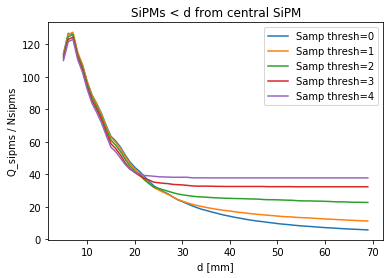

In [362]:
nevents = len(matched_events)
print('Total Events', nevents)
samp_thresholds = [0,1,2,3,4]
for samp_thresh in samp_thresholds:
    nevents = len(matched_events)
    dcuts = np.arange(5,70,1)
    nsipms = {dcut:[] for dcut in dcuts}
    Q = {dcut:[] for dcut in dcuts}
    Q_N = {dcut:[] for dcut in dcuts}
    for evt in range(nevents):
        event = matched_events[evt]
        #print('Event '+str(event))
        pmap = pmaps[event]
        s2 = pmap.s2s[0]

        charge = np.zeros_like(s2.sipms.all_waveforms)
        charge[s2.sipms.all_waveforms >= samp_thresh] = s2.sipms.all_waveforms[s2.sipms.all_waveforms >= samp_thresh]
        #s2.sipms.all_waveforms[s2.sipms.all_waveforms < samp_thresh] = 0
        sipms_kept = np.argwhere(s2.sipms.all_waveforms >= samp_thresh)[:,0]
        XY = (good_xs[event], good_ys[event])

        for dcut in range(len(dcuts)):
            sipms_d = xya.get_nearby_sipm_inds(XY, dcuts[dcut], xys)
            sipms_d = np.intersect1d(sipms_d, sipms_kept)
            q = sum([np.sum(charge[i,:]) for i in sipms_d])
            n = len(sipms_d)
            nsipms[dcuts[dcut]].append(n)
            Q[dcuts[dcut]].append(q)
            if q == 0:
                Q_N[dcuts[dcut]].append(0)
            else:
                Q_N[dcuts[dcut]].append(q/n)
                #print(q, q/n, n)

    Q_var = []
    Q_mean = []
    Nsipm_var = []
    Nsipm_mean = []
    Q_N_mean = []
    Q_N_var = []
    for dcut in dcuts:
        q_var = np.var(Q[dcut])
        Q_var.append(q_var)
        q_mean = np.mean(Q[dcut])
        Q_mean.append(q_mean)
        nsipm_var = np.var(nsipms[dcut])
        Nsipm_var.append(nsipm_var)
        nsipm_mean = np.mean(nsipms[dcut])
        Nsipm_mean.append(nsipm_mean)

        q_n_var = q_var/nsipm_mean**2 + nsipm_var * q_mean**2 / nsipm_mean**4
        Q_N_var.append(q_n_var)
        Q_N_mean.append(np.mean(Q_N[dcut]))

    
    plt.plot(dcuts, Q_N_mean, label='Samp thresh='+str(samp_thresh))
plt.xlabel('d [mm]')
plt.ylabel('Q_sipms / Nsipms')
plt.title('SiPMs < d from central SiPM')
plt.legend()
plt.show()

In [347]:
b = np.array([[1,12,3],[1,0,22]])
samp_thresh = 4
charge = np.zeros_like(b)
charge[b >= samp_thresh] = b[b >= samp_thresh]

In [348]:
charge

array([[ 0, 12,  0],
       [ 0,  0, 22]])

# Noise cuts at pmap level

In [21]:
filename = '/Users/taylorcontreras/Development/Research/nz_studies/data/sipm_noise.out'
sipm_noise = np.loadtxt(filename, dtype=float) # average noise/us for every SiPM

In [23]:
np.shape(sipm_noise)

(1792,)

In [27]:
event = matched_events[0]
pmap = pmaps[event]
s2 = pmap.s2s[0]
noisesub = s2.sipms.sum_over_times - sipm_noise*len(s2.sipms.all_waveforms[0,:])

In [49]:
nevents = len(matched_events)
Qs_nsub = []
Qs_nsub_old = []
Qs_wn = []
for evt in range(nevents):
    
    event = matched_events[evt]
    pmap = pmaps[event]
    s2 = pmap.s2s[0]
    width = len(s2.sipms.all_waveforms[0,:])
    noisesub = s2.sipms.sum_over_times - sipm_noise*width
    Qs_nsub.append(np.sum(noisesub))
    
    q = np.sum(s2.sipms.sum_over_times)
    Qs_wn.append(q)
    Qs_nsub_old.append(q - (68.6 * 1e-3 * 1792 * width))

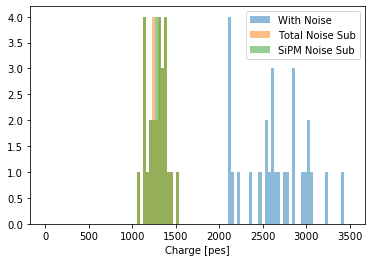

In [53]:
plt.hist(Qs_wn, range=(0,3500), bins=100, alpha=0.5, label='With Noise')
plt.hist(Qs_nsub_old, range=(0,3500), bins=100, alpha=0.5, label='Total Noise Sub')
plt.hist(Qs_nsub, range=(0,3500), bins=100, alpha=0.5, label='SiPM Noise Sub')
plt.xlabel('Charge [pes]')
plt.legend()
plt.show()

In [ ]:
nevents = len(matched_events)
print('Total Events', nevents)
samp_thresholds = [0,1,2,3,4]
for samp_thresh in samp_thresholds:
    nevents = len(matched_events)
    dcuts = np.arange(5,70,1)
    nsipms = {dcut:[] for dcut in dcuts}
    Q = {dcut:[] for dcut in dcuts}
    Q_N = {dcut:[] for dcut in dcuts}
    for evt in range(nevents):
        event = matched_events[evt]
        #print('Event '+str(event))
        pmap = pmaps[event]
        s2 = pmap.s2s[0]

        charge = np.zeros_like(s2.sipms.all_waveforms)
        charge[s2.sipms.all_waveforms >= samp_thresh] = s2.sipms.all_waveforms[s2.sipms.all_waveforms >= samp_thresh]
        #s2.sipms.all_waveforms[s2.sipms.all_waveforms < samp_thresh] = 0
        sipms_kept = np.argwhere(s2.sipms.all_waveforms >= samp_thresh)[:,0]
        XY = (good_xs[event], good_ys[event])

        for dcut in range(len(dcuts)):
            sipms_d = xya.get_nearby_sipm_inds(XY, dcuts[dcut], xys)
            sipms_d = np.intersect1d(sipms_d, sipms_kept)
            q = sum([np.sum(charge[i,:]) for i in sipms_d])
            n = len(sipms_d)
            nsipms[dcuts[dcut]].append(n)
            Q[dcuts[dcut]].append(q)
            if q == 0:
                Q_N[dcuts[dcut]].append(0)
            else:
                Q_N[dcuts[dcut]].append(q/n)
                #print(q, q/n, n)

    Q_var = []
    Q_mean = []
    Nsipm_var = []
    Nsipm_mean = []
    Q_N_mean = []
    Q_N_var = []
    for dcut in dcuts:
        q_var = np.var(Q[dcut])
        Q_var.append(q_var)
        q_mean = np.mean(Q[dcut])
        Q_mean.append(q_mean)
        nsipm_var = np.var(nsipms[dcut])
        Nsipm_var.append(nsipm_var)
        nsipm_mean = np.mean(nsipms[dcut])
        Nsipm_mean.append(nsipm_mean)

        q_n_var = q_var/nsipm_mean**2 + nsipm_var * q_mean**2 / nsipm_mean**4
        Q_N_var.append(q_n_var)
        Q_N_mean.append(np.mean(Q_N[dcut]))

    
    plt.plot(dcuts, Q_N_mean, label='Samp thresh='+str(samp_thresh))
plt.xlabel('d [mm]')
plt.ylabel('Q_sipms / Nsipms')
plt.title('SiPMs < d from central SiPM')
plt.legend()
plt.show()